In [1]:
import pandas as pd

file_path = "Data/cleaned_data.csv"

data = pd.read_csv(file_path)

data.set_index('customer_unique_id', inplace=True)

mapper = {'product_category_name_english' : 'prod_category'}
data = data.rename(mapper, axis = 1)

# Modelling
* This notebook will present the modelling attempts.
* The workflow is as follows:
    * Generate clusters with KMeans on all features
    * Compute silhouette score for each n_clusters parameter-value
    * Analyze silhouette score per cluster for different parameters
    * Interpret the clusters
    
* We will repeat the workflow for different subsets of features
* The goal is to find:
    * well separated clusters for given subset of features
    * meaningful clusters in a business-sense so that targeted marketing strategies may be implemented
    * number of features as well as clusters should be as low as possible to be interpretable
    


# Clustering

## Subset of data

Since data is large, and computing silhouette score is time-consuming (quadratic complexity), we will work on a 10% subsample for the rest of the analysis.

In [2]:
from sklearn.model_selection import train_test_split

data, _ = train_test_split(data, test_size=0.9,
                                       stratify=data['prod_category'], 
                                    random_state = 42)

## KMeans 

* KMeans is one of the most useful algorithms for clustering.
* It is :
    * simple
    * fast
    * often accurate

### All features

#### Silhouette score

In [3]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from category_encoders import OneHotEncoder
from sklearn.compose import ColumnTransformer
import matplotlib.pyplot as plt
import numpy as np


### Displays plot with silhouette score for different n_clusters-parameter values with KMeans
def silhouette_scores(features, n_clusters_range):
    
    numeric_features = data[features].columns[(data[features].dtypes == 'float64') | 
                                (data[features].dtypes == 'int64')]
    numeric_preprocessor = Pipeline([('imputer', SimpleImputer(strategy='median')),
                             ('scaler', StandardScaler())])
    
                                    
                                    
    categorical_features = data[features].columns[data[features].dtypes == 'object']
    categorical_preprocessor = Pipeline([('imputer', SimpleImputer(strategy='most_frequent')),
                            ('one_hot', OneHotEncoder()),
                             ('scaler', StandardScaler())])
    
    if len(categorical_features) >= 1:                                
        preprocessor = ColumnTransformer([('numeric_preprocessor',numeric_preprocessor,
                                    numeric_features),('categorical_preprocessor',categorical_preprocessor,
                                    categorical_features)])
    else:
        preprocessor = ColumnTransformer([('numeric_preprocessor',numeric_preprocessor,
                                    numeric_features)])
    
    
    
                                                  
    kmeans = Pipeline([('preprocessor', preprocessor),
                       ('KMeans', KMeans(random_state=42))])
    
    
    scores = {}
    
    for n_clusters in n_clusters_range:
        params = {'KMeans__n_clusters' : n_clusters}
        kmeans.set_params(**params)
        kmeans.fit(data[features])
                                                  
        labels = kmeans.named_steps['KMeans'].labels_
        
        feature_matrix = kmeans.named_steps['preprocessor'].transform(data[features])
        
        silhouette = silhouette_score(feature_matrix, labels,sample_size = int(0.2*len(labels)), random_state = 42)
        inertia = kmeans.named_steps['KMeans'].inertia_
        
        scores[n_clusters] = {'silhouette_score' : silhouette,
                        'inertia' : inertia, 
                                'labels' : labels}


    fig = plt.figure(figsize=(12, 4))
    
    inertias = [scores[n_clusters]['inertia'] for n_clusters in n_clusters_range]
    
    ax = fig.add_subplot(1,2,1)
    
    ax.plot(inertias, marker = 'o', markersize = 10, 
        linestyle = 'dashed', color = 'red', 
           markerfacecolor = 'blue')
    ax.set_xticks(np.arange(0,len(n_clusters_range), 1))
    ax.set_xticklabels(n_clusters_range, fontsize = 12)
    ax.set_title('Inertia vs n_clusters', fontsize = 16, pad = 16)
    ax.set_ylabel('Inertia', fontsize = 14)
    ax.set_xlabel('n_clusters', fontsize = 14)
    
    
    silhouette_scores = [scores[n_clusters]['silhouette_score'] for n_clusters in n_clusters_range]
    
    ax = fig.add_subplot(1,2,2)
    ax.plot(silhouette_scores, marker = 'o', markersize = 10, 
        linestyle = 'dashed', color = 'red', 
           markerfacecolor = 'blue')
    ax.set_xticks(np.arange(0,len(n_clusters_range), 1))
    ax.set_xticklabels(n_clusters_range, fontsize = 12)
    ax.set_title('Silhouette score vs n_clusters', fontsize = 16, pad = 16)
    ax.set_ylabel('Silhouette score', fontsize = 14)
    ax.set_xlabel('n_clusters', fontsize = 14)
    
    fig.tight_layout()
    
    return feature_matrix, scores

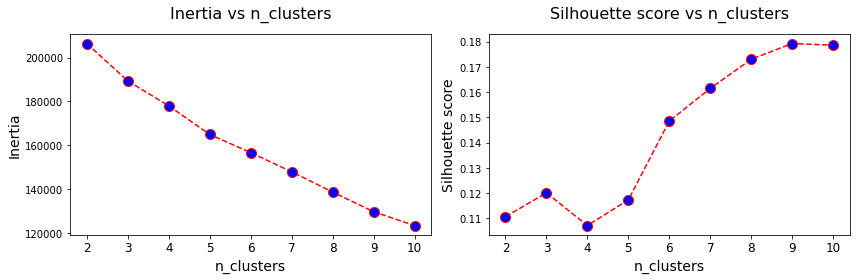

In [4]:
feature_matrix, scores = silhouette_scores(data.columns,
                range(2,11))

* We can measure the optimal number of clusters either using the 'elbow' method on the inertia plot or upon silhouette scores. 
* Selecting optimal parameter-value with silhouette is more robust since it calculates distances accross clusters and therefore quantifies their separability. 
* Here the silhouette scores on all features are weak, much close to 0 than 1, which mean clusters overlap.


#### Silhouette per cluster

In [5]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm


### Computes silhouette_score of each cluster for a given number of clusters
def silhouette_analysis(features_matrix, scores, param_values):

                                
    fig = plt.figure(figsize=(16, 9))

    ### In this loop 
    for i, param_value in enumerate(param_values):

        ax = fig.add_subplot(2, 3, i+1)
        # The silhouette coefficient can range from -1, 1

        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.

        labels = scores[param_value]['labels']
        
        ### Compute global silhouette score
        
        silhouette = scores[param_value]['silhouette_score']
        
        ### Compute silhouette score for each sample
        sample_silhouette_values = silhouette_samples(
            feature_matrix, labels)
        

        ax.set_xlim([min(sample_silhouette_values)-0.05,
                     max(sample_silhouette_values)+0.05])
        ax.set_ylim([0, len(data) + (param_value + 1) * 20])

        y_lower = 50

        cluster_label_position = []

        ax.axvline(x=silhouette, linestyle='dashed', color='red')
        
        ### 
        for label in range(param_value):
            jth_cluster_silhouette_values = sample_silhouette_values[labels == label]

            jth_cluster_silhouette_values.sort()

            size_cluster_j = jth_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_j

            color = cm.nipy_spectral(float(label) / param_value)
            ax.fill_betweenx(np.arange(y_lower, y_upper),
                             0, jth_cluster_silhouette_values,
                             facecolor=color, edgecolor=color, alpha=0.7)
            
            # Label the silhouette plots with their cluster numbers at the middle
            cluster_label_position.append((y_lower + y_upper)/2)

        # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax.set_yticks(cluster_label_position)
        ax.set_yticklabels(range(param_value), fontsize=10)
        ax.set_title("k = " + str(param_value), fontsize=16)
        ax.set_xlabel("The silhouette coefficient values")
        ax.set_ylabel("Cluster label", fontsize=12)
    
    fig.tight_layout()
    

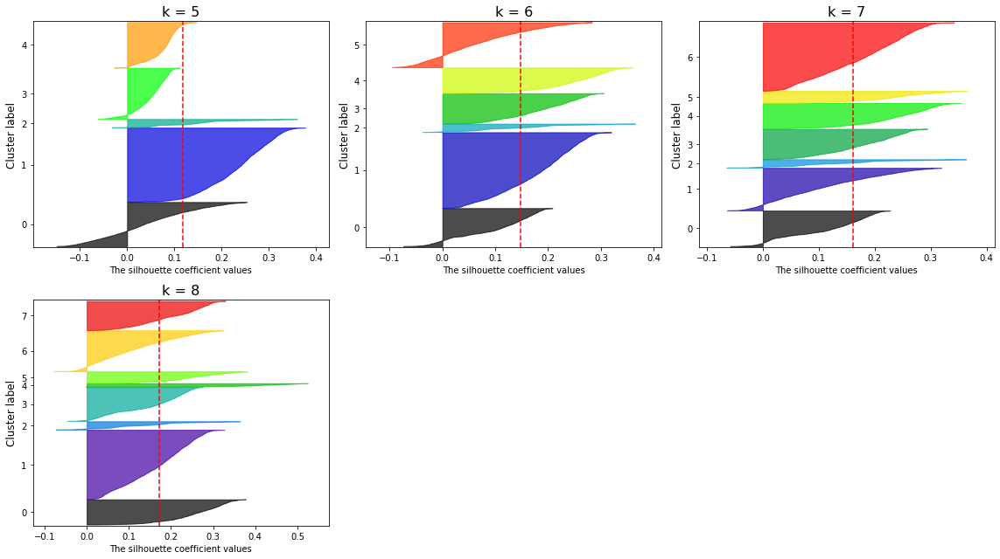

In [6]:
silhouette_analysis(feature_matrix, scores, [5,6,7,8])

Some samples of some clusters are actually closer to samples from other clusters than theirs.

#### Clusters interpretation

In [7]:
from sklearn.preprocessing import MinMaxScaler
from math import pi

def cluster_descriptor(feature_matrix, features, n_clusters, scores):
    
    feature_matrix = feature_matrix.copy()
    
    scaler = MinMaxScaler()
    feature_matrix = scaler.fit_transform(feature_matrix)
    
    ### Perform one-hot encoding to get encoded features labels
    enc = OneHotEncoder(use_cat_names=True)
    feature_names = enc.fit_transform(data[features]).columns
    
    fig = plt.figure(figsize=(64,224))

    N = len(feature_names)
    labels = scores[n_clusters]['labels']
    
    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    
    for i, label in enumerate(set(labels)):
        ax = fig.add_subplot(10, 3, i+1, polar=True)
        ax.set_rlabel_position(0)
        ax.set_theta_offset(pi / 2)
        ax.set_theta_direction(-1)
        
        mask = (labels == label)
        label_data = feature_matrix[mask]
        
        vector = label_data.mean(axis = 0)
        ax.plot(angles, vector, linewidth=1,
                linestyle='solid', label=label)
        ax.fill(angles, vector, 'b', alpha=0.1)
        ax.set_xticks(angles)
        ax.set_xticklabels(feature_names, fontsize=36, rotation=angles)
        ax.set_yticks([0.1,0.5,0.75,1])
        ax.set_yticklabels(['0.1', '0.5', '0.75', '1'], fontsize = 12)
        ax.set_ylim([0,1])
        ax.legend(loc='best', bbox_to_anchor=(0.1, 0.1), fontsize = 56)
    plt.subplots_adjust(hspace = 0.5)
    fig.tight_layout()

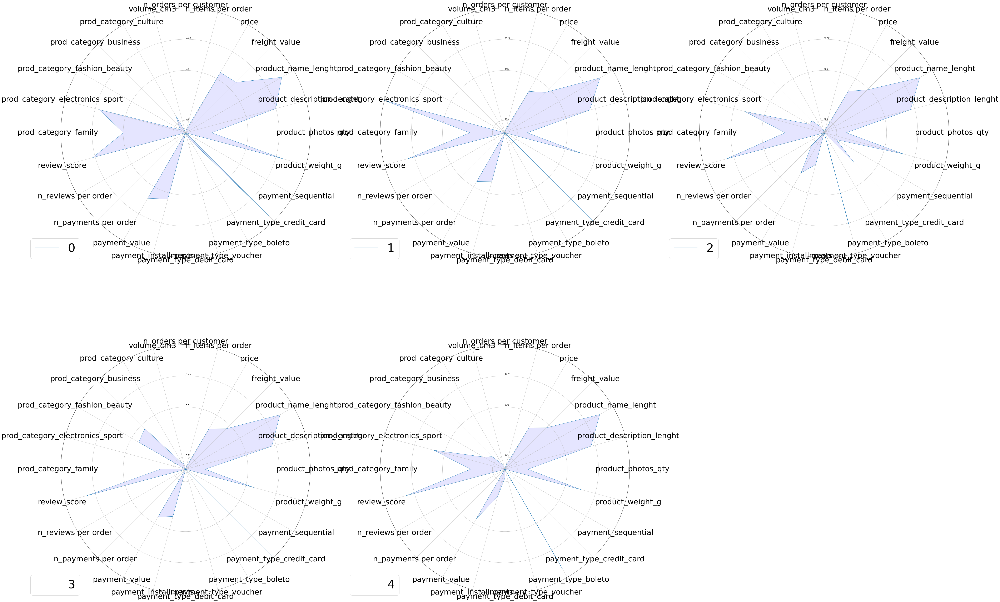

In [8]:
cluster_descriptor(feature_matrix, data.columns, 5, scores)

* The shapes of the clusters are difficult to distinguish one from another.
* The clusters are badly separated.
* Some features are poorly represented.


### Features subset 1

#### Silhouette score 

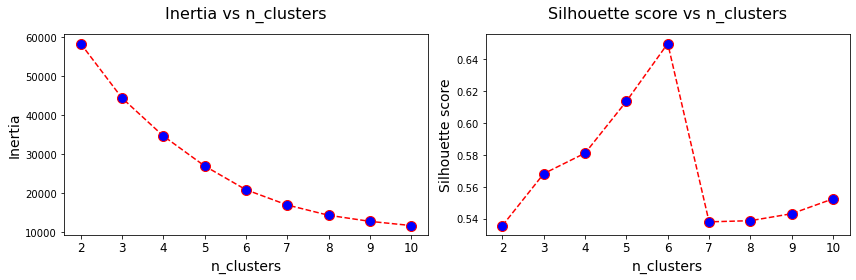

In [9]:
features_v1 = ['n_orders per customer', 'n_payments per order',
            'n_items per order',
               'price', 'payment_type_credit_card', 'payment_type_boleto',
       'payment_type_voucher', 'payment_type_debit_card']

cluster_range = range(2,11)

feature_matrix, scores_v1 = silhouette_scores(features_v1, cluster_range)

* Silhouette scores for this subset of features are higher on overall.
* We reach a maximum for n_clusters = 6

#### Silhouette per cluster

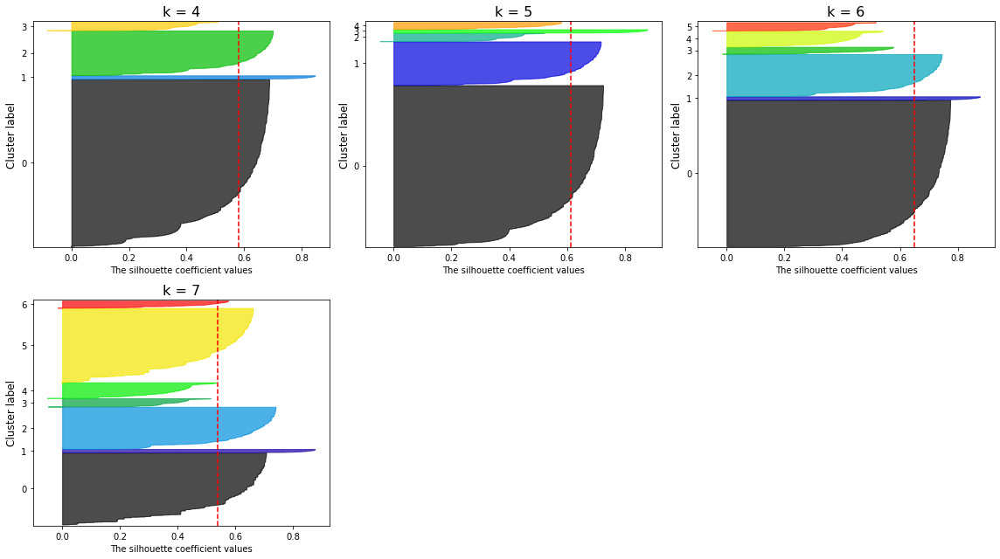

In [10]:
silhouette_analysis(feature_matrix, scores_v1, [4,5,6,7])

Size of the clusters are more balanced when k = 7, even though the overall silhouette score is slightly lower.

#### Clusters interpretation

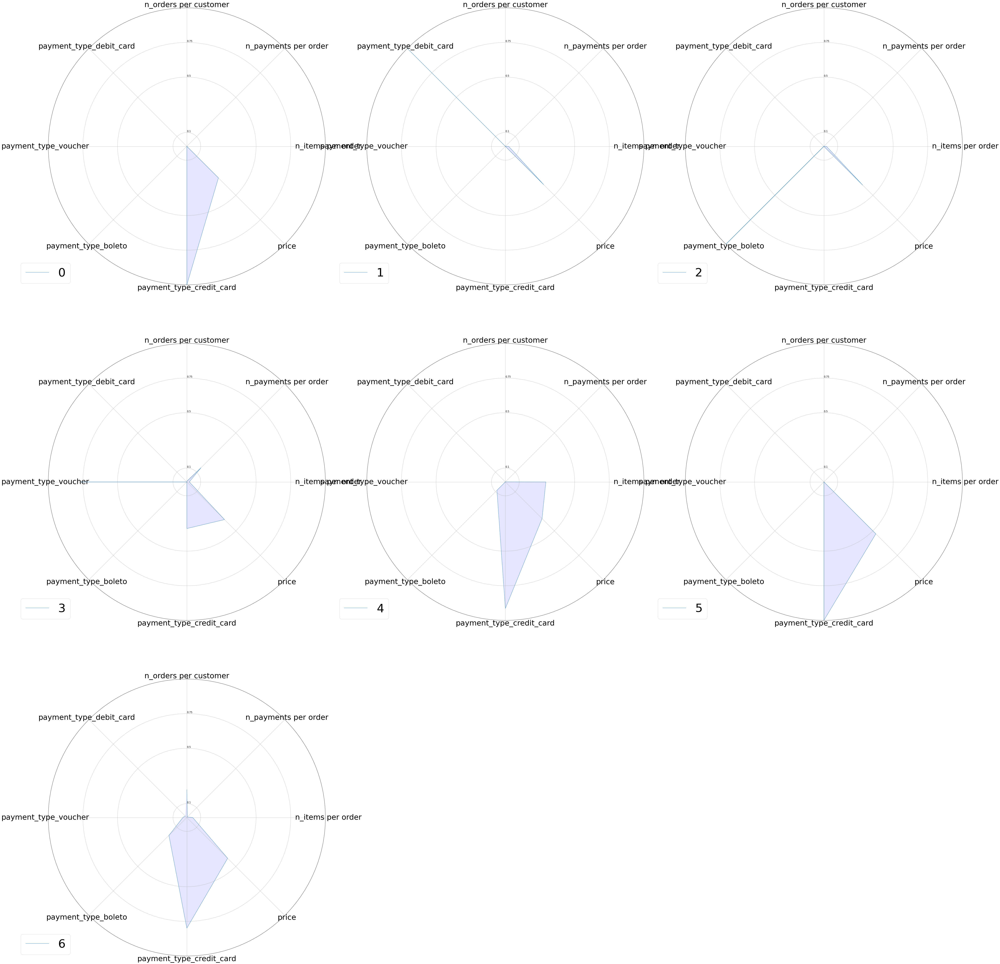

In [11]:
cluster_descriptor(feature_matrix, features_v1, 7, scores_v1)

* The clusters are better separated on this subset of features
* The shapes of the clusters are quite different and interpretable
* But the main clusters, especially 1 & 5, are not that different

### Features subset 2

#### Silhouette score

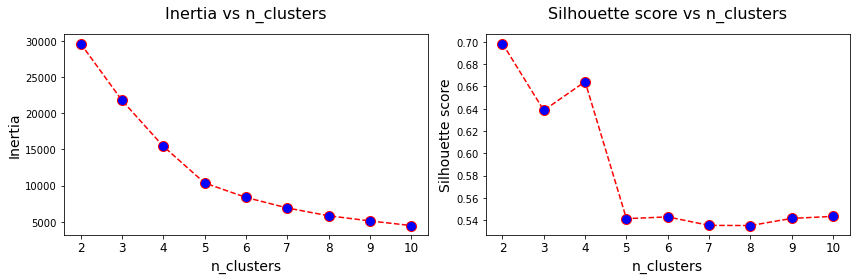

In [12]:
features_v2 = ['n_orders per customer', 'n_payments per order',
            'n_items per order',
               'price']

cluster_range = range(2,11)

feature_matrix, scores_v2 = silhouette_scores(features_v2, cluster_range)

#### Silhouette per cluster

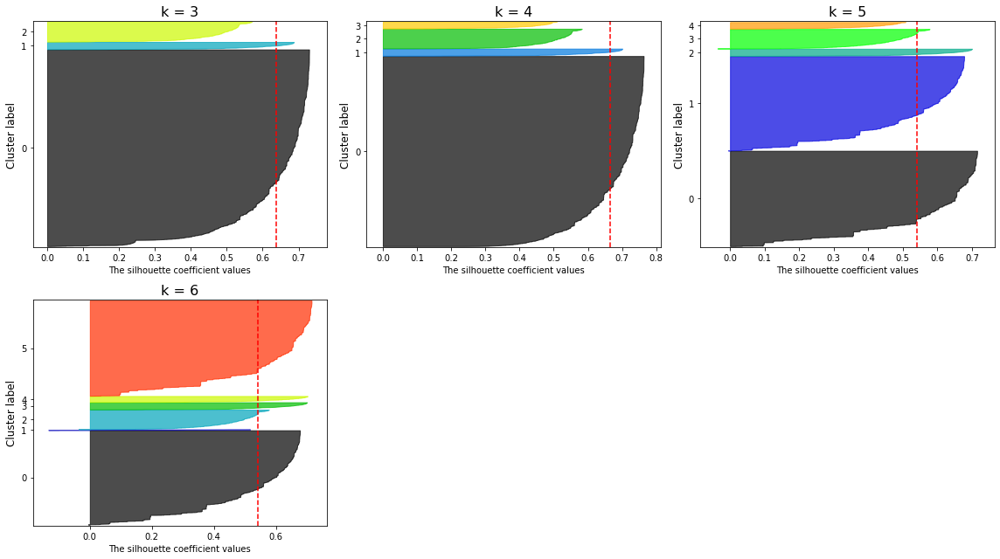

In [13]:
silhouette_analysis(feature_matrix, scores_v2, [3,4,5,6])

Clusters are more balanced for k = 5 or k = 6 .

#### Clusters interpretation

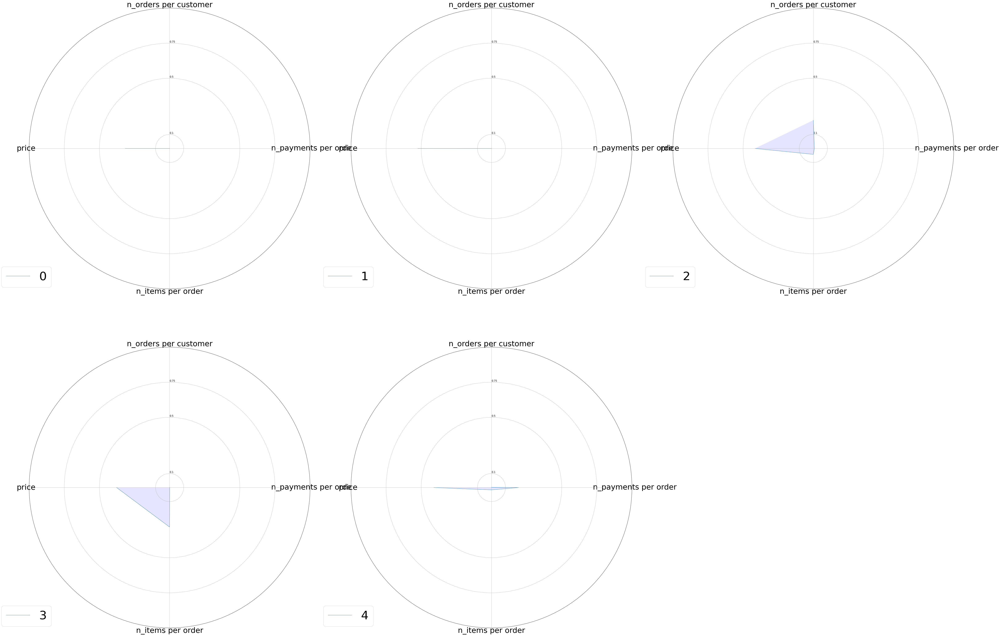

In [14]:
cluster_descriptor(feature_matrix, features_v2, 5, scores_v2)

* Clusters interpretation is difficult here 
* The two main clusters (0 and 4) have pretty much the same shape and do not give a lot of information accross features

### Features subset 3

#### Silhouette score

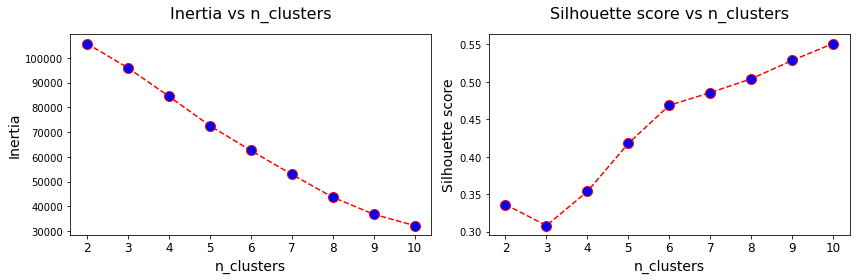

In [15]:
features_v3 = ['n_orders per customer', 'n_payments per order',
            'n_items per order',
               'price', 'prod_category', 
              'payment_type_credit_card', 'payment_type_boleto',
       'payment_type_voucher', 'payment_type_debit_card']

cluster_range = range(2,11)

feature_matrix, scores_v3 = silhouette_scores(features_v3, cluster_range)

#### Silhouette per cluster

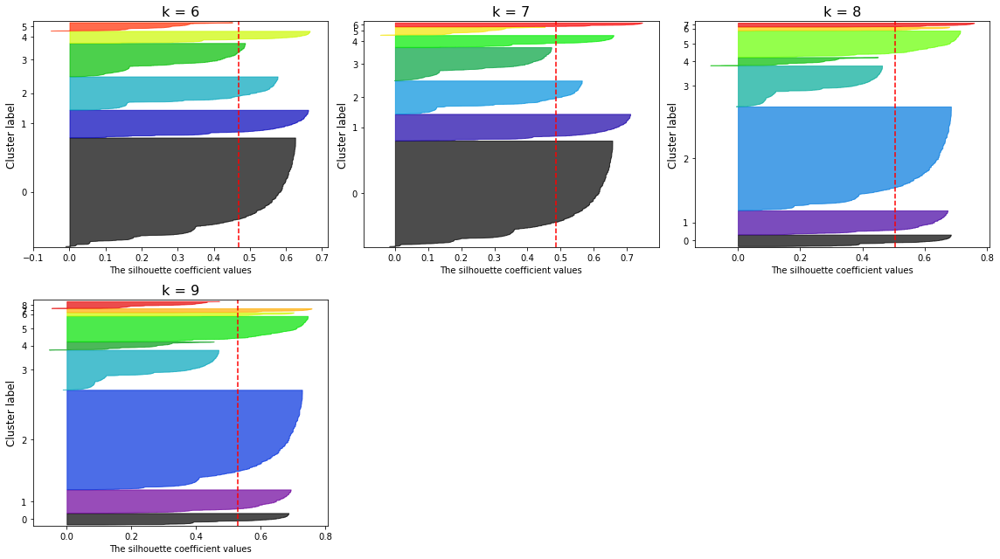

In [16]:
silhouette_analysis(feature_matrix, scores_v3, [6,7,8,9])

#### Clusters interpretation

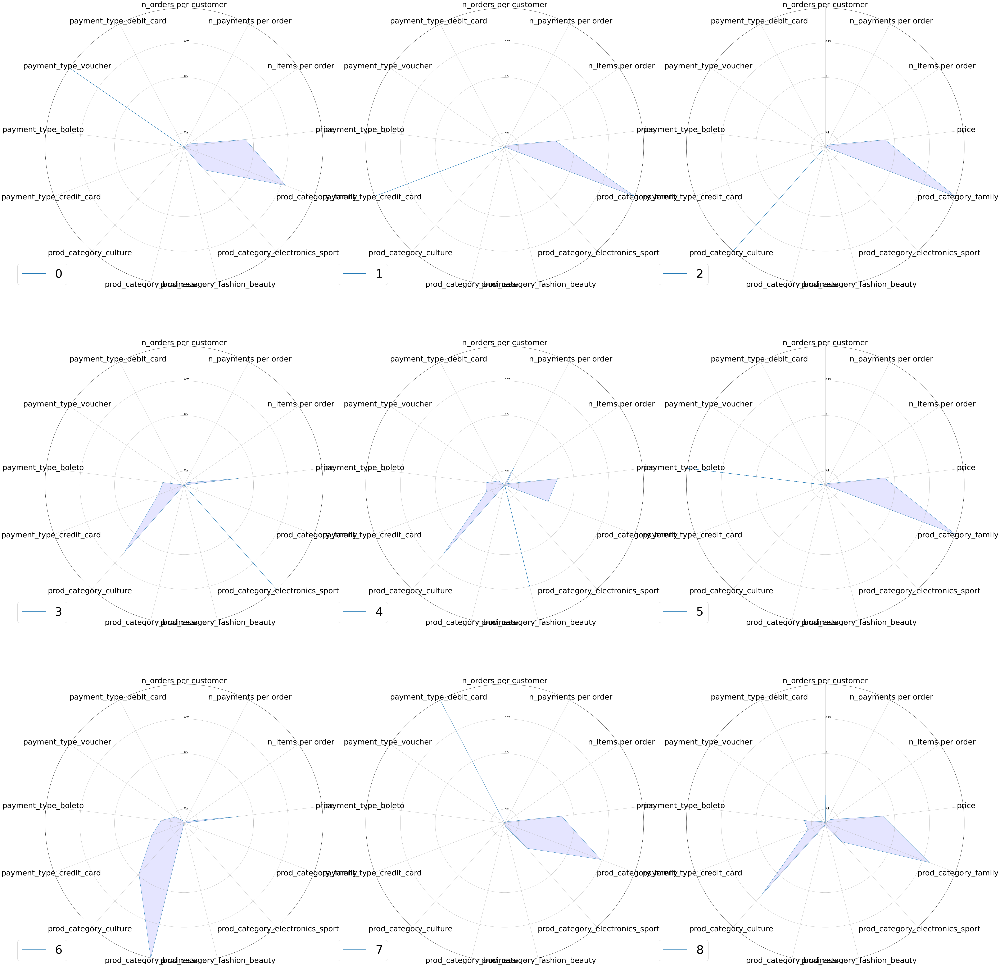

In [17]:
cluster_descriptor(feature_matrix, features_v3, 9, scores_v3)

* Clusters are interpretable since they have different shapes
* Clusters are meaningful in a business-sense : product category of interest, type of payment...
* Numerical discrete features do not seem to bring useful information on clusters
* We may try another subset of features and also a larger number of clusters to go more in depth in cluster descriptions

### Features subset 4 

#### Silhouette score

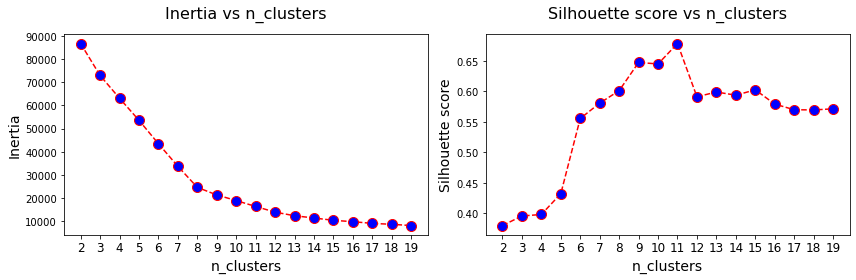

In [18]:
features_v4 = ['price', 'prod_category', 
              'payment_type_credit_card', 'payment_type_boleto',
       'payment_type_voucher', 'payment_type_debit_card', 'n_payments per order']

cluster_range = range(2,20)

feature_matrix, scores_v4 = silhouette_scores(features_v4, cluster_range)

* Optimal separability is reached for k = 9
* However other parameter values may produce better balanced clusters and/or better clusters interpretation

#### Silhouette per cluster

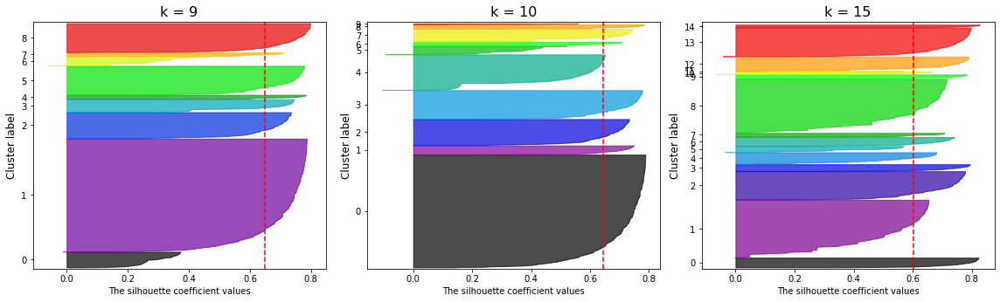

In [19]:
silhouette_analysis(feature_matrix, scores_v4, [9,10,15])

* Samples are better balanced accross labels for k = 15
* The clusters are robust for that parameter, even though some samples in few clusters seem to be misclassified, but it is alse the case with lower numbers of clusters.


#### Clusters interpretation

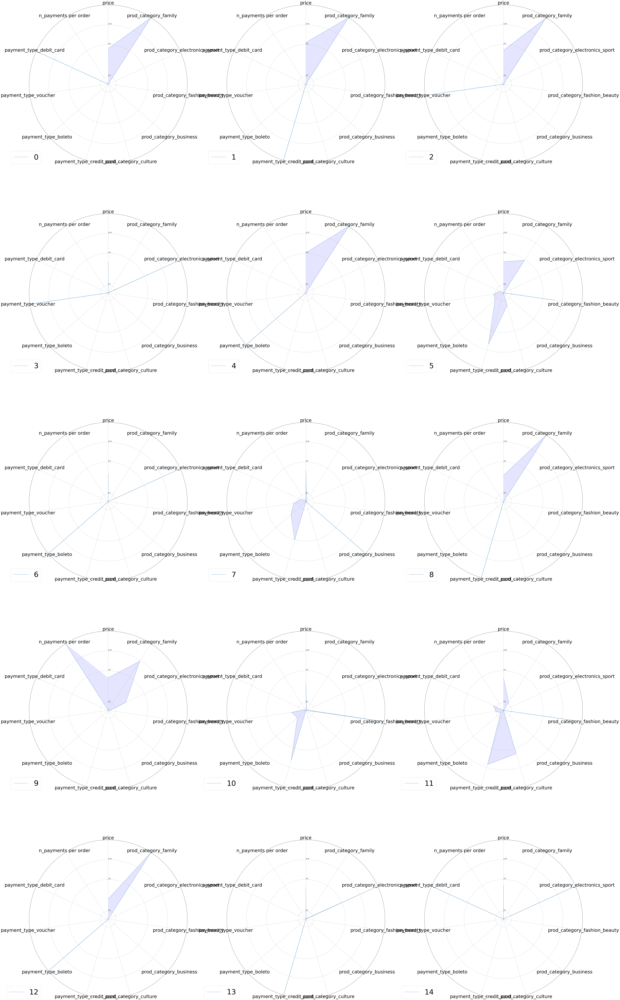

In [20]:
cluster_descriptor(feature_matrix, features_v4, 15, scores_v4)

* The clusters are meaningul in a business-sense
* They give insights on the consumers behaviors

## DBSCAN

We will try other estimators with the same subset of features.

#### Silhouette score

In [21]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score


def dbscan_silhouette_scores(features, eps_range):

    numeric_features = data[features].columns[(data[features].dtypes == 'float64') | 
                                (data[features].dtypes == 'int64')]
    numeric_preprocessor = Pipeline([('imputer', SimpleImputer(strategy='median')),
                             ('scaler', StandardScaler())])
    
                                    
                                    
    categorical_features = data[features].columns[data[features].dtypes == 'object']
    categorical_preprocessor = Pipeline([('imputer', SimpleImputer(strategy='most_frequent')),
                            ('one_hot', OneHotEncoder()),
                             ('scaler', StandardScaler())])
    
    if len(categorical_features) >= 1:                                
        preprocessor = ColumnTransformer([('numeric_preprocessor',numeric_preprocessor,
                                    numeric_features),('categorical_preprocessor',categorical_preprocessor,
                                    categorical_features)])
    else:
        preprocessor = ColumnTransformer([('numeric_preprocessor',numeric_preprocessor,
                                    numeric_features)])

        
        
        
    dbscan = Pipeline([('preprocessor', preprocessor), 
    ('DBSCAN', DBSCAN())])
    
    scores = {}
    
    for eps in eps_range:
        params = {'DBSCAN__eps' : eps}
        dbscan.set_params(**params)
        labels = dbscan.fit_predict(data[features])
        feature_matrix = dbscan.named_steps['preprocessor'].transform(data[features])
        
        silhouette = silhouette_score(feature_matrix,labels)
        scores[eps] = {'n_clusters' : len(np.unique(labels)), 
                    'silhouette_score' : silhouette, 
                    'labels' : labels}

        
    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_subplot(1, 2, 1)
    
    silhouette_scores = [scores[eps]['silhouette_score'] for eps in eps_range]
    ax.plot(silhouette_scores, marker='o', markersize=10,
            linestyle='dashed', color  = 'red', 
        markerfacecolor = 'blue')
    ax.set_xticks(np.arange(0, len(eps_range), 1))
    ax.set_xticklabels([eps.round(decimals=1) for eps in eps_range], fontsize=12, rotation = 90)
    ax.set_title('Silhouette', fontsize=20)
    ax.set_ylabel('silhouette_score', fontsize=16)
    ax.set_xlabel('EPS', fontsize = 14)
    
    
    ax = fig.add_subplot(1, 2, 2)
    
    n_clusters = [scores[eps]['n_clusters'] for eps in eps_range]
    ax.plot(n_clusters, marker='o', markersize=10,
            linestyle='dashed', color  = 'red', 
        markerfacecolor = 'blue')
    ax.set_xticks(np.arange(0, len(eps_range), 1))
    ax.set_xticklabels([eps.round(decimals=1) for eps in eps_range], fontsize=12, rotation = 90)
    ax.set_title('Number of clusters', fontsize=20)
    ax.set_ylabel('n_clusters', fontsize=16)
    ax.set_xlabel('EPS', fontsize = 14)

    plt.tight_layout()

    return feature_matrix, scores

##### Mean distance between points

In [22]:
from scipy.spatial import distance_matrix

dist_matrix = distance_matrix(feature_matrix,feature_matrix)

print('Mean distance between samples is : ' + str(sum(sum(dist_matrix)/(len(feature_matrix)**2-len(feature_matrix)))))

Mean distance between samples is : 4.008243169413428


* Mean distance between samples is ~ 4
* We will try a range of parameter values for eps on the two sides of that value

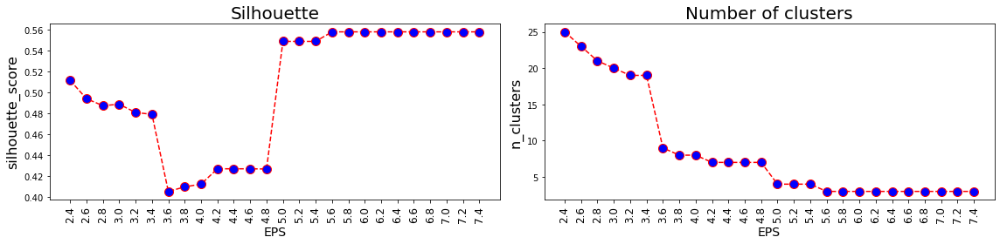

In [23]:
eps_range = np.arange(2.4, 7.6, 0.2).round(decimals = 1)

feature_matrix, scores = dbscan_silhouette_scores(features_v4, eps_range)

* We get a reasonable number of clusters for eps values superior to 3
* On that range of parameters the optimal silhouette scores considering the number of clusters may be 3, 3.2 and 5

#### Silhouette per cluster

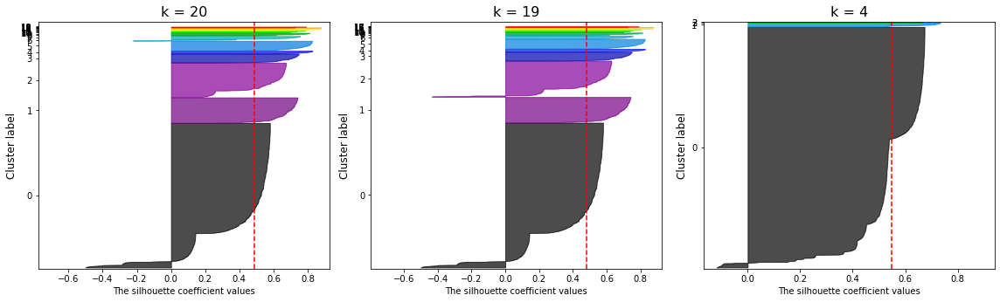

In [24]:
### Transform the output so it fits as input of silhouette analysis function 
eps_values = [3,3.2,5]

dbscan_scores = {}

for eps_value in eps_values:
    dbscan_scores[scores[eps_value]['n_clusters']] = {'silhouette_score' : scores[eps_value]
                                        ['silhouette_score'],
                                               'labels' : scores[eps_value]['labels']}

optimal_n_clusters = [key for key in dbscan_scores.keys()]

silhouette_analysis(feature_matrix, dbscan_scores, optimal_n_clusters)

* Silhouette score is better for k = 4, but clusters are highly unbalanced.
* Models with k = 19 or k = 20 produce robust clusters on the overall, despite some samples seem misclassified
* Clusters are still unbalanced with a single cluster that contains most of the samples

#### Clusters interpretation

In [25]:
cluster_descriptor(feature_matrix, features_v4, 19, dbscan_scores)

* Clusters have different shapes but there is an overrepresented cluster
* The clusters are less well separated than with KMeans, with an inferior overall silhouette score
* As for now we will keep KMeans solution

## GMM

* We will estimate clusters with GaussianMixtureModel on the same subset of features

In [26]:
from sklearn.mixture import GaussianMixture

### Displays plot with silhouette score for different n_clusters-parameter values with GMM
def gmm_silhouette_scores(features, n_clusters_range):
    
    numeric_features = data[features].columns[(data[features].dtypes == 'float64') | 
                                (data[features].dtypes == 'int64')]
    numeric_preprocessor = Pipeline([('imputer', SimpleImputer(strategy='median')),
                             ('scaler', StandardScaler())])
    
                                    
                                    
    categorical_features = data[features].columns[data[features].dtypes == 'object']
    categorical_preprocessor = Pipeline([('imputer', SimpleImputer(strategy='most_frequent')),
                            ('one_hot', OneHotEncoder()),
                             ('scaler', StandardScaler())])
    
    if len(categorical_features) >= 1:                                
        preprocessor = ColumnTransformer([('numeric_preprocessor',numeric_preprocessor,
                                    numeric_features),('categorical_preprocessor',categorical_preprocessor,
                                    categorical_features)])
    else:
        preprocessor = ColumnTransformer([('numeric_preprocessor',numeric_preprocessor,
                                    numeric_features)])
    
    
    
                                                  
    gmm = Pipeline([('preprocessor', preprocessor),
                       ('gmm', GaussianMixture(random_state=42, n_init = 10))])
    
    
    scores = {}
    
    for n_clusters in n_clusters_range:
        params = {'gmm__n_components' : n_clusters}
        gmm.set_params(**params)
        
                                                  
        labels = gmm.fit_predict(data[features])
        
        feature_matrix = gmm.named_steps['preprocessor'].transform(data[features])
        
        silhouette = silhouette_score(feature_matrix, labels,sample_size = int(0.2*len(labels)), random_state = 42)
        
        scores[n_clusters] = {'silhouette_score' : silhouette,
                                'labels' : labels}


    fig = plt.figure(figsize=(12, 4))
    
    silhouette_scores = [scores[n_clusters]['silhouette_score'] for n_clusters in n_clusters_range]
    
    ax = fig.add_subplot(1,2,1)
    ax.plot(silhouette_scores, marker = 'o', markersize = 10, 
        linestyle = 'dashed', color = 'red', 
           markerfacecolor = 'blue')
    ax.set_xticks(np.arange(0,len(n_clusters_range), 1))
    ax.set_xticklabels(n_clusters_range, fontsize = 12)
    ax.set_title('Silhouette score vs n_clusters', fontsize = 16, pad = 16)
    ax.set_ylabel('Silhouette score', fontsize = 14)
    ax.set_xlabel('n_clusters', fontsize = 14)
    
    fig.tight_layout()
    
    return feature_matrix, scores

### Silhouette score

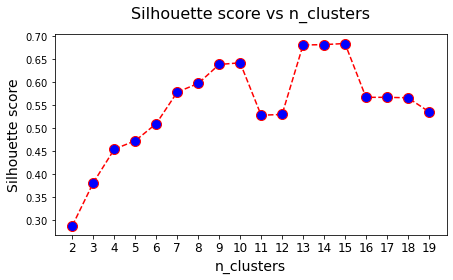

In [27]:
n_components = range(2,20)

feature_matrix, gmm_scores = gmm_silhouette_scores(features_v4, n_components)

* We seem to reach an optimal silhouette score for k = 12
* Optimal parameter values go from 8 to 13 clusters
* Clusters seem better separeted than with KMeans

### Silhouette per cluster

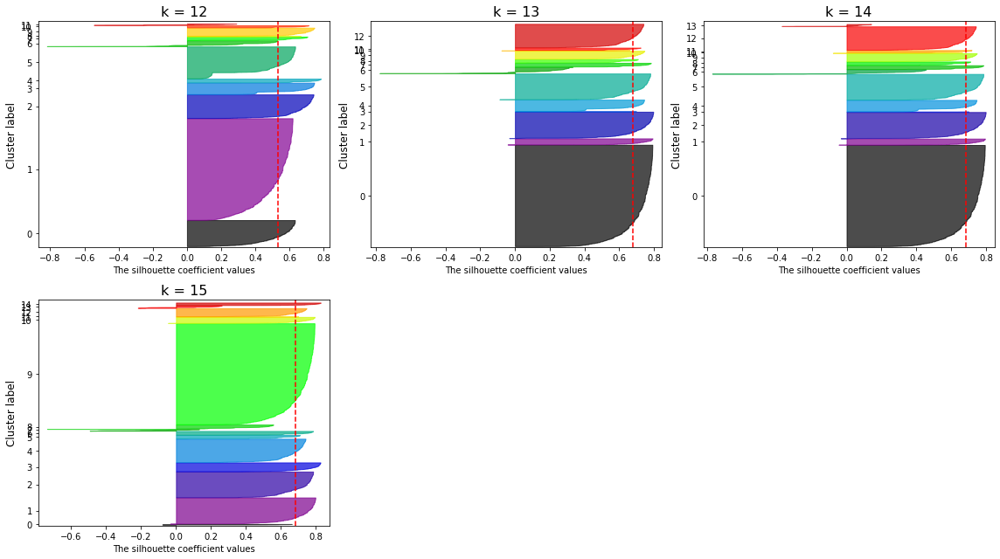

In [28]:
silhouette_analysis(feature_matrix, gmm_scores, [12,13,14,15])

* The optimal value is for k = 12
* Distribution of clusters are quite unbalanced, with a cluster containing approximatively half of the samples

### Clusters interpretation

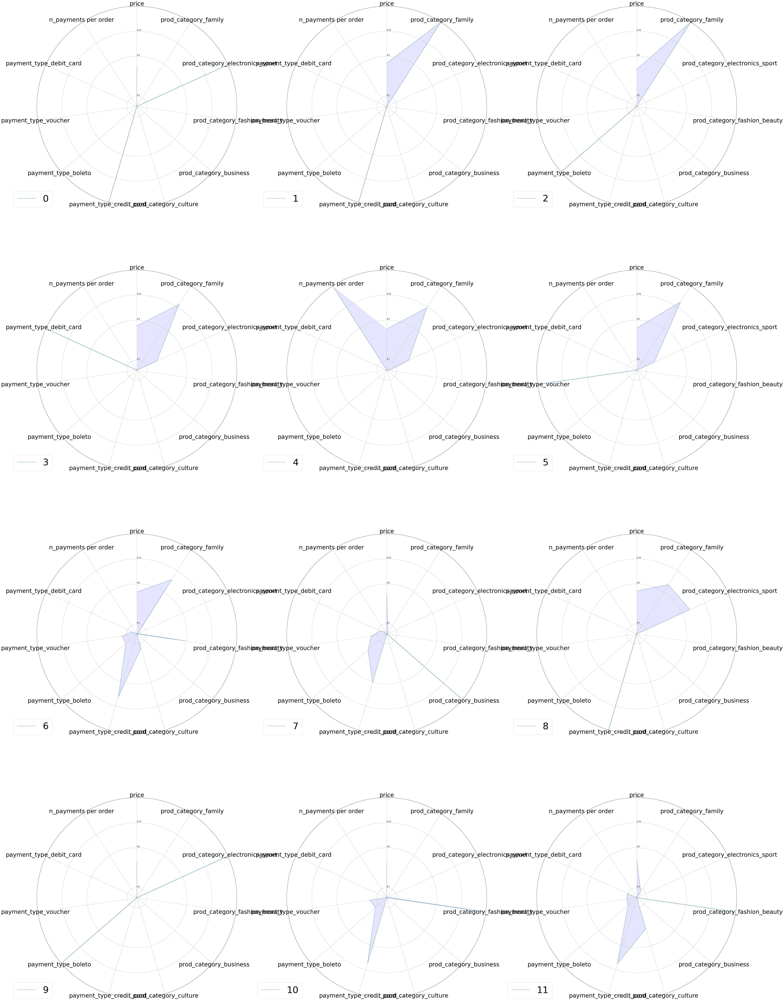

In [29]:
cluster_descriptor(feature_matrix, features_v4, 12, gmm_scores)

* Clusters have different shapes and give business insights
* Even though the overall silhouette score is slightly higher than with KMeans, the clusters are better balanced with the latter
* The proportion of probably-misclassified samples is also higher than with KMeans
* For these reasons we will keep KMeans as the best clusters' estimator

## Best model : KMeans

## Clusters robustness  accross estimators

* For a common number of fitted clusters, we will perform Adjusted Rand Score between KMeans labels and both DBSCAN & GMM.



* This will give us an insight on the robustness of the clusters: are they resistant accross estimators or are they specific to each estimator ?



* Previous plots suggest that clusters are first defined by the clustering algorith method, but to what extent ?


In [30]:
from sklearn.metrics import adjusted_rand_score
import seaborn as sns
### Compute ARI score between KMeans predicted labels and GMM & DBSCAN predicted labels
### for a common number of clusters

def ari_score_estimators(kmeans_scores, dbscan_scores, gmm_scores, n_clusters):
    
    kmeans_labels = kmeans_scores[n_clusters]['labels']
    
    dbscan_labels = dbscan_scores[n_clusters]['labels']
    
    gmm_labels = gmm_scores[n_clusters]['labels']
    
    kmeans_dbscan_score = adjusted_rand_score(kmeans_labels, dbscan_labels)
    
    kmeans_gmm_score = adjusted_rand_score(kmeans_labels, gmm_labels)
    
    gmm_dbscan_score = adjusted_rand_score(gmm_labels, dbscan_labels)
    
    
    palette = sns.color_palette("viridis", n_colors = 3)

    fig = plt.figure(figsize = (12,6))
    
    ax = fig.add_subplot(111)
    
    ax.bar(x = np.arange(0,3,1), height = [kmeans_dbscan_score, kmeans_gmm_score, 
                                        gmm_dbscan_score], 
        width = 0.8, color = palette)
    
    ax.set_title('ARI score among estimators, ' + str(n_clusters) + ' clusters', fontsize = 20, pad = 16)
    ax.set_ylabel('ARI score', fontsize = 16)
    ax.set_xticks(np.arange(0,3,1))
    ax.set_ylim([0,1])
    ax.set_xticklabels(['KMeans/DBSCAN', 'KMeans/GMM', 'GMM/DBSCAN'], fontsize = 12)
    plt.yticks(fontsize = 12)
    
    


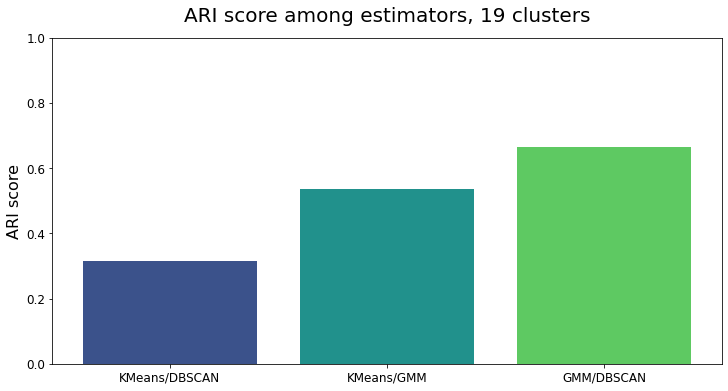

In [31]:
### 13 is a common number of fitted clusters by three estimators
ari_score_estimators(scores_v4, dbscan_scores, gmm_scores, 19)

Interesting to note that GMM fitted clusters are quite close to both KMeans and DBSCAN clusters, whereas KMeans and DBSCAN clusters are to each other closer to random permutation than to consistent mapping.   

## Initialization resistance

* Since KMeans is sensitive to the initial position of the centroids when fitting a model,  finding only local optima, we will assess the robustness of the fitted clusters by implementing the estimator through different random states


* Robust clusters should resist different initialization states


* This will be quantified computing adjusted rand score between a set of reference labels and sets of predicted labels with different random states


* The closer to 1 the better


In [40]:
def initialization_resistance(n_init, reference_labels, feature_matrix):
    

    ari_scores = []

    for i in range(n_init):
        kmeans = KMeans(n_clusters = 15)
        labels = kmeans.fit_predict(feature_matrix)
        ari_score = adjusted_rand_score(reference_labels, labels)
        ari_scores.append(ari_score)


    fig = plt.figure(figsize=(6, 4))

    ax = fig.add_subplot(111)

    ax.plot(ari_scores, linestyle='dashed', marker='o',
            markersize=10, markerfacecolor = 'blue', 
        color = 'red')
    ax.set_xticks(np.arange(0, n_init, 1))
    ax.set_xticklabels(np.arange(0,n_init,1)+1, fontsize=12)
    ax.set_title('KMeans: initialization stability, n_clusters: ' + str(len(np.unique(reference_labels))), 
                                                            fontsize=16, pad = 16)
    ax.set_xlabel('Initializations', fontsize=14)
    ax.set_ylabel('ARI score', fontsize=14)
    

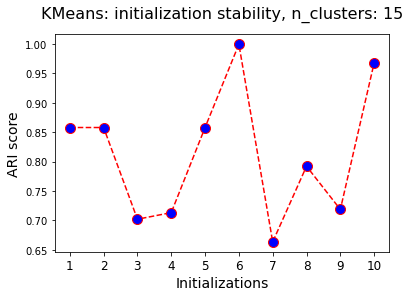

In [41]:
reference_labels = scores_v4[15]['labels'] 

initialization_resistance(10, reference_labels,feature_matrix)

* The clusters persistency accross initializations is satisfying


* The preservation of the groups is nearly optimal in most of the initializations (ARI score really close to 1)


* It suggests that the fitted clusters are really underlying to the data

## Model temporal stability

* We will now control for the temporal stability of the model

* For how long will it remain relevant ?

* The workflow is as follows:
    * we will filter on one year of orders 
    * aggregate the filtered data and predict labels which will be our reference labels
    * add one month of consumption, aggregate the data, fit the model and predict new labels
    * compute ARI score on our reference population between these two periods
    * repeat the steps adding one month at a time
    * this process will give us an insight of the persistency of the model over time
    

In [47]:
from build_table_per_interval import aggregate_per_time_interval
from custom_transformers import Features_engineering, log_transformer


def temporal_stability(intervals):
    
    reference_interval = ['2016-09-04', '2017-09-04']

    ### Aggregated table filtered by reference time interval
    reference_data = aggregate_per_time_interval(reference_interval)
    
    ### Drop lines with NAns on many features
    reference_data = reference_data.dropna(subset = ['price','n_items per order',
        'product_category_name_english'], how = 'all')
    
    
    ### Defining the Pipeline with a ColumnTransformer
    cat_cols = ['product_category_name_english']
    
    cat_preprocessor = Pipeline([('features_engineering', Features_engineering()),
                                 ('one_hot_encoder', OneHotEncoder()),
                                 ('scaler', StandardScaler())])
    
    num_cols = ['payment_type_credit_card', 'payment_type_boleto',
           'payment_type_voucher', 'payment_type_debit_card', 'n_payments per order', 
                'price']
    
    num_preprocessor = Pipeline([('log_transformation', log_transformer()),
                    ('imputer', SimpleImputer(strategy='median')),
                                 ('scaler', StandardScaler())])

    preprocessor = ColumnTransformer([('cat_preprocessor', cat_preprocessor, cat_cols),
                                      ('num_preprocessor', num_preprocessor, num_cols)])
    
    ### adding KMeans to the Pipeline
    kmeans = Pipeline([('preprocessor', preprocessor),
                       ('KMeans', KMeans(n_clusters=15, random_state=42))])
    
    
    ### Reference labels 
    reference_labels = kmeans.fit_predict(reference_data)
    
    ### Create column in df so that labels can be identified by their key
    reference_data['reference_labels'] = reference_labels
    
    ari_scores = []

    for interval in intervals:

        data = aggregate_per_time_interval(interval)
        
        data = data.dropna(subset = ['price','n_items per order',
        'product_category_name_english'], how = 'all')

        labels = kmeans.fit_predict(data)
        
        data['labels'] = labels
        
        ### Filter on reference population
        mask = data.index.isin(reference_data.index)
        data = data[mask]
        
        ### Concatenate so that both vectors containing labels have same order of samples
        concat_df = pd.concat([reference_data, data], axis = 1)
        
        reference_labels = concat_df['reference_labels']
        labels = concat_df['labels']
        
        ### compute ARI score between two sets of predictions at different times for the same population
        ari_score = adjusted_rand_score(reference_labels, labels)
        ari_scores.append(ari_score)


    fig = plt.figure(figsize=(6, 4))

    ax = fig.add_subplot(111)

    ax.plot(ari_scores, linestyle='dashed', marker='o',
            markersize=10, markerfacecolor = 'blue', 
        color = 'red')
    ax.set_xticks(np.arange(0, len(intervals), 1))
    ax.set_xticklabels(np.arange(0,len(intervals),1)+1,fontsize=12)
    ax.set_title('KMeans: temporal stability, n_clusters: ' + str(len(np.unique(reference_labels))), 
                                                            fontsize=16, pad = 16)
    ax.set_xlabel('Months', fontsize=14)
    ax.set_ylabel('ARI score', fontsize=14)
    

In [ ]:
intervals = [('2016-09-04', '2017-10-04'), ('2016-09-04', '2017-11-04'),
                 ('2016-09-04', '2017-12-04'), ('2016-09-04', '2018-01-04'),
             ('2016-09-04', '2018-02-04'), ('2016-09-04', '2018-03-04'),
                 ('2016-09-04', '2018-04-04'), ('2016-09-04', '2018-05-04'),
                 ('2016-09-04', '2018-06-04'), ('2016-09-04', '2018-07-04'),
                 ('2016-09-04', '2018-08-04')]


temporal_stability(intervals)

In [43]:
time_data = aggregate_per_time_interval(('2016-09-04', '2017-12-04'))

time_data.shape

                                  n_orders per customer  n_items per order  \
customer_unique_id                                                           
0000f46a3911fa3c0805444483337064                      1                1.0   
0000f6ccb0745a6a4b88665a16c9f078                      1                1.0   
0004aac84e0df4da2b147fca70cf8255                      1                1.0   
0005e1862207bf6ccc02e4228effd9a0                      1                1.0   
0006fdc98a402fceb4eb0ee528f6a8d4                      1                1.0   

                                   price  freight_value  product_name_lenght  \
customer_unique_id                                                             
0000f46a3911fa3c0805444483337064   69.00          17.22                 49.0   
0000f6ccb0745a6a4b88665a16c9f078   25.99          17.63                 43.0   
0004aac84e0df4da2b147fca70cf8255  180.00          16.89                 58.0   
0005e1862207bf6ccc02e4228effd9a0  135.00          15.

(39241, 22)

* Persistency of  clusters over time is an issue


* The clusters computed on one year of orders are not relevant five months later


* This may be an illustration that consuming behaviors evolve over time

# Conclusion


* We built a KMeans clustering model that fitted quite robust, well balanced and meaningful clusters


* We are confident it may serve as a basis for implementing an online marketing strategy


* The velocity of changes in online consuming will require an update of the model in few months

* Further research shall try to add new features either by aggregation or transformation, and also try other estimators

